In [2]:
import numpy as np
import matplotlib.pyplot as plt

from bokeh.io import output_notebook, show, export_png,export_svgs, save
from bokeh.plotting import figure, show, output_file
import bokeh.palettes
from bokeh.layouts import column,gridplot
from bokeh.models import HoverTool, ColumnDataSource, LinearColorMapper
from bokeh.models.glyphs import Text
from bokeh.palettes import Category20
from bokeh.palettes import inferno

output_notebook()

Loading BokehJS ...

In [12]:
phiPath =  '/Volumes/GoogleDrive/My Drive/PFS/CobraModuleTestResult/Science15/ImageData/20190801/phiConvergeTest/'
phiData = np.load(phiPath+'phiData.npy')
thetaData = np.load('/Volumes/GoogleDrive/My Drive/PFS/CobraData/20190712/thetaTest2/thetaData.npy')

In [14]:
centers = np.load(phiPath+'phiCenter.npy')


array([   0.           +0.j        , 1937.67683861+1013.29123508j,
       1887.12950797 +885.10220456j, 1851.77795397+1013.17902891j,
       1804.02530545 +881.77056345j, 1765.00040821+1013.02814056j,
       1718.19746207 +883.10649414j, 1677.25638709+1012.49404247j,
       1629.4054318  +881.70504203j, 1590.56475046+1010.77819216j,
       1539.31669695 +882.25175118j, 1503.23737701+1011.80348563j,
       1451.56110786 +881.15279197j, 1414.0424549 +1009.88141438j,
       1365.12025406 +879.85119681j, 1325.18720923+1010.14728126j,
       1276.70890317 +880.00744918j, 1237.53355203+1010.5304538j ,
       1190.2961675  +879.30769031j, 1151.06770413+1008.73298466j,
       1103.32757849 +879.98717005j, 1059.19986184+1007.77851424j,
       1015.91259382 +877.44794256j,  974.23535317+1007.97118606j,
        930.0724525  +877.35746912j,  886.14313026+1006.88921219j,
        841.19781531 +877.75751193j,  801.75215093+1004.98476946j,
        752.61212603 +877.72663921j, 1908.83418995 +969.539355

In [15]:
phiData

array([[[[0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         ...,
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00]],

        [[0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         ...,
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00]],

        [[0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         ...,
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         [

In [5]:
brokens = []
badIdx = np.array(brokens) - 1
goodIdx = np.array([e for e in range(57) if e not in badIdx])

In [6]:
x = np.arange(9)

In [7]:
np.rad2deg(np.append([0], phiData[1,0,:,0]))

array([ 0.        , 16.34334188, 15.30743505, 15.06187711, 15.0299356 ,
       15.02432021, 15.02287598, 15.02027231, 15.02633936])

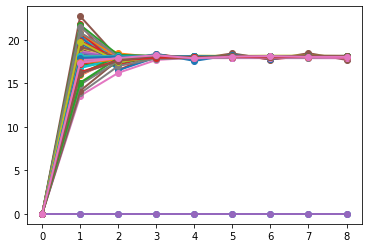

In [8]:
plt.figure(1)
plt.clf()
for cob in goodIdx:
    for ite in range(1,2):
        plt.plot(x, np.rad2deg(np.append([0], phiData[cob,ite,:,0])), marker='o', linewidth=2)

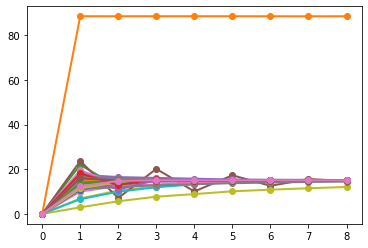

In [9]:
plt.figure(2)
plt.clf()
for cob in goodIdx:
    for ite in range(1):
        plt.plot(x, np.rad2deg(np.append([0], thetaData[cob,ite,:,0])), marker='o', linewidth=2)

In [16]:
runs=50
margin = 15
output_file("spare15_phi_convergence.html")

def plotPhiConvergence(phiData, runs, fiberNo):
    TOOLS = ['pan','box_zoom','wheel_zoom', 'save' ,'reset','hover']

    title_string=f"Fiber {fiberNo+1} Phi"
    p = figure( tools=TOOLS, x_range=[0,9], y_range=[-20,180],
               plot_height=400, plot_width=500,title=title_string)
    p.xaxis.axis_label = 'Iteration Number'
    p.yaxis.axis_label = 'Angle Difference from Phi Target'

    #mapper = Category40[runs]
    mapper = inferno(runs)

    for i in range(runs):
        angle = margin + (180 - 2 * margin) * i / (runs - 1)
        ydata= angle - np.rad2deg(np.append([0], phiData[fiberNo,i,:,0]))
        p.circle(x=x, y=ydata,radius=0.08,color=mapper[-i])
        p.line(x=x, y=ydata,line_width=2,color=mapper[-i])
    return p

parray=[]

for fiberNo in goodIdx:
    p=plotPhiConvergence(phiData, runs, fiberNo)
    parray.append(p)

grid = gridplot(parray, ncols=4, plot_width=250, plot_height=250)
show(grid)

In [17]:
runs=30
output_file("spare02_theta_convergence.html")
margin = 15

def plotThetaConvergence(thetaData, runs, fiberNo):
    TOOLS = ['pan','box_zoom','wheel_zoom', 'save' ,'reset','hover']

    title_string=f"Fiber {fiberNo+1} Theta"
    p = figure( tools=TOOLS, x_range=[0,9], y_range=[-20,360],
               plot_height=400, plot_width=500,title=title_string)
    p.xaxis.axis_label = 'Iteration Number'
    p.yaxis.axis_label = 'Angle Difference from Theta Target'

    mapper = inferno(runs)
    for i in range(runs):
        angle = margin + (360 - 2 * margin) * i / (runs - 1)
        ydata= angle - np.rad2deg(np.append([0], thetaData[fiberNo-1,i,:,0]))
        p.circle(x=x, y=ydata,radius=0.08,color=mapper[-i])
        p.line(x=x, y=ydata,line_width=2,color=mapper[-i])
    return p

parray=[]

for fiberNo in goodIdx:
    p=plotThetaConvergence(thetaData, runs, fiberNo)
    parray.append(p)

grid = gridplot(parray, ncols=4, plot_width=250, plot_height=250)
show(grid)

In [ ]:
margin=15
runs = 5
for i in range(runs):
    angle = margin + (360 - 2 * margin) * i / (runs - 1)
    print(angle)

In [ ]:
np.rad2deg(phiData[56,1,:,0]), np.rad2deg(phiData[56,2,:,0]),

In [ ]:
np.rad2deg(thetaData[np.array([7,16,20,30]),0,7,0])

In [ ]:
np.rad2deg(thetaData[:,0,7,0]), np.rad2deg(thetaData[:,1,7,0])

In [ ]:
plt.figure(3)
plt.clf()
ite = 2

plt.subplot(211)
for cob in goodIdx[goodIdx <= 26]:
    plt.plot(phiData[cob,ite,:,1], phiData[cob,ite,:,2], 'go')

plt.subplot(212)
for cob in goodIdx[goodIdx > 26]:
    plt.plot(phiData[cob,ite,:,1], phiData[cob,ite,:,2], 'go')

In [ ]:
plt.figure(4)
plt.clf()
ite = 0

plt.subplot(211)
for cob in goodIdx[goodIdx <= 26]:
    plt.plot(thetaData[cob,ite,:,1], thetaData[cob,ite,:,2], 'go')

plt.subplot(212)
for cob in goodIdx[goodIdx > 26]:
    plt.plot(thetaData[cob,ite,:,1], thetaData[cob,ite,:,2], 'go')

In [ ]:
from bokeh.palettes import Category20
from bokeh.palettes import inferno

In [ ]:
mapper = Category20[20]

In [ ]:
mapper

In [ ]:
c = inferno(30)

In [ ]:
c